# Exploratory Dataset Analysis

After downloading and preliminary processing of redundant and useless data in the database, we analyze the basic situation of the data set.
In this section, we will present information about 50 painters and study the artist's style and personal information.

First import the packages need to use

In [1]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Then display the dataset path

In [2]:
os.listdir('./')

['.ipynb_checkpoints', 'artists.csv', 'Dataset_Analysis.ipynb', 'images']

## Extract the information of csv file

In [3]:
df = pd.read_csv('./artists.csv', index_col=False)
print(df.head(5))

   id                name        years                         genre  \
0   0   Amedeo Modigliani  1884 - 1920                 Expressionism   
1   1  Vasiliy Kandinskiy  1866 - 1944  Expressionism,Abstractionism   
2   2        Diego Rivera  1886 - 1957       Social Realism,Muralism   
3   3        Claude Monet  1840 - 1926                 Impressionism   
4   4       Rene Magritte  1898 - 1967      Surrealism,Impressionism   

  nationality                                                bio  \
0     Italian  Amedeo Clemente Modigliani (Italian pronunciat...   
1     Russian  Wassily Wassilyevich Kandinsky (Russian: Васи́...   
2     Mexican  Diego María de la Concepción Juan Nepomuceno E...   
3      French  Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...   
4     Belgian  René François Ghislain Magritte (French: [ʁəne...   

                                        wikipedia  paintings  
0  http://en.wikipedia.org/wiki/Amedeo_Modigliani        193  
1  http://en.wikipedia.org/wiki/

In [4]:
df = df.drop(['bio','wikipedia','id'], axis=1)

In [5]:
artist = df[['name','paintings','nationality']]

Sort descendings by number and reset index

Here we found that only 30 painters have more than 100 paintings identified as their paintings. Since the remaining painters have too few paintings, we decided to use only the top 30 painters in the subsequent data classification and research.

Vincent van Gogh, Edgar Degas, and Pablo Picasso are the three painters with the most paintings.

In [6]:
num_paintings = artist.sort_values(by = ['paintings'], ascending = False)
num_paintings = num_paintings.reset_index(drop = True)
print(num_paintings)

                         name  paintings               nationality
0            Vincent van Gogh        877                     Dutch
1                 Edgar Degas        702                    French
2               Pablo Picasso        439                   Spanish
3       Pierre-Auguste Renoir        336                    French
4              Albrecht Dürer        328                    German
5                Paul Gauguin        311                    French
6              Francisco Goya        291                   Spanish
7                   Rembrandt        262                     Dutch
8               Alfred Sisley        259            French,British
9                      Titian        255                   Italian
10               Marc Chagall        239  French,Jewish,Belarusian
11              Rene Magritte        194                   Belgian
12          Amedeo Modigliani        193                   Italian
13                  Paul Klee        188              German,S

Analysis of the artist's nationality.

It can be seen that among the 50 most famous painters recognized by the world, the largest number of French painters

In [7]:
cla_national = artist.sort_values(by = ['nationality'], ascending = False)
cla_national = cla_national.reset_index(drop = True)
print(cla_national)

                         name  paintings               nationality
0                    El Greco         87             Spanish,Greek
1             Diego Velazquez        128                   Spanish
2               Salvador Dali        139                   Spanish
3                   Joan Miro        102                   Spanish
4              Francisco Goya        291                   Spanish
5               Pablo Picasso        439                   Spanish
6               Andrei Rublev         99                   Russian
7          Vasiliy Kandinskiy         88                   Russian
8            Kazimir Malevich        126                   Russian
9              Mikhail Vrubel        171                   Russian
10               Edvard Munch         67                 Norwegian
11               Diego Rivera         70                   Mexican
12                Frida Kahlo        120                   Mexican
13          Leonardo da Vinci        143                   Ita

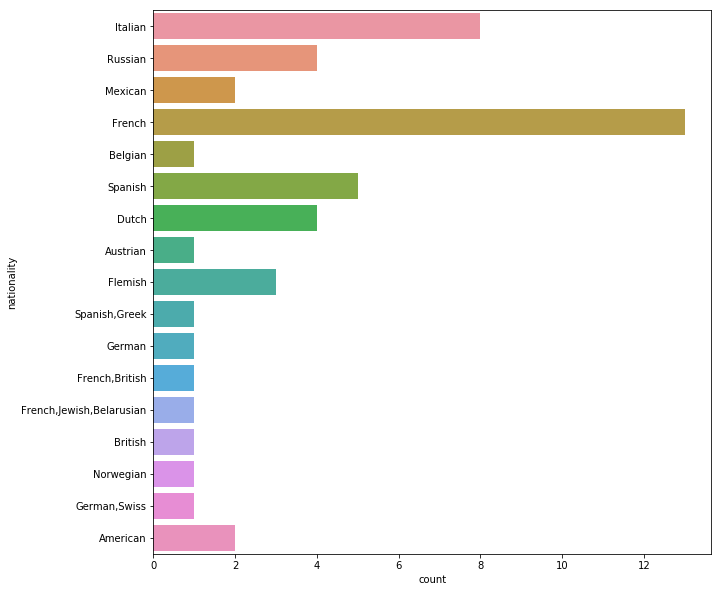

In [8]:
import seaborn as sns
plt.figure(figsize=(10,10))
nationality = sns.countplot(data = df, y='nationality')
nationality

According to the style of the posterity of his paintings, classification.
10 of the 50 painters are Impressionism

In [9]:
genre = df[['name','genre']]
cla_genre = genre.sort_values(by = 'genre')
cla_genre = cla_genre.reset_index(drop = True)
print(cla_genre)

                         name                                    genre
0             Jackson Pollock                   Abstract Expressionism
1                   Rembrandt                                  Baroque
2             Diego Velazquez                                  Baroque
3                  Caravaggio                                  Baroque
4           Peter Paul Rubens                                  Baroque
5               Andrei Rublev                            Byzantine Art
6               Pablo Picasso                                   Cubism
7           Sandro Botticelli                        Early Renaissance
8           Amedeo Modigliani                            Expressionism
9          Vasiliy Kandinskiy             Expressionism,Abstractionism
10                  Paul Klee  Expressionism,Abstractionism,Surrealism
11                    Raphael                         High Renaissance
12          Leonardo da Vinci                         High Renaissance
13    

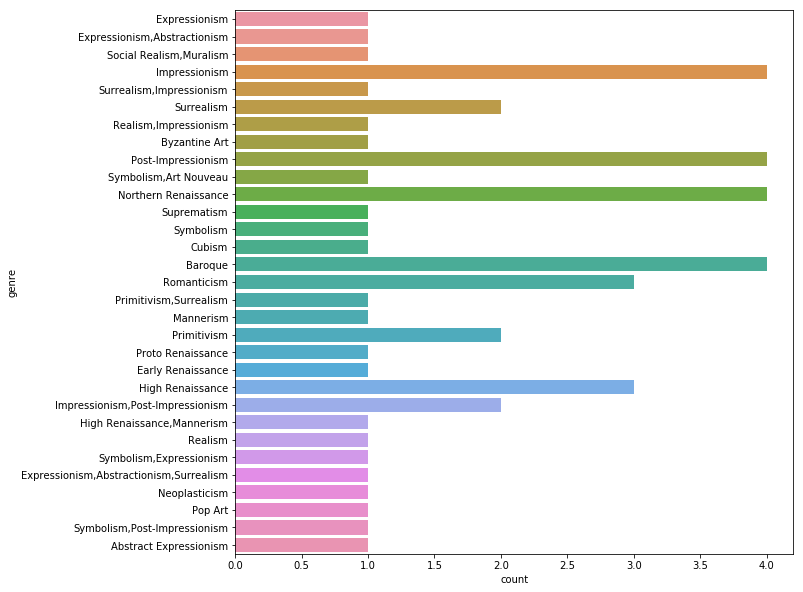

In [10]:
plt.figure(figsize=(10,10))
genre = sns.countplot(data = genre, y='genre')
genre

## Display paintings

In [11]:
from glob import glob
def plot_img(artist):
    path = './images/' + artist + '/**'
    all_img = glob(path)
    plt.figure(figsize=(15,15))
    plt.subplots_adjust(wspace=0, hspace=0)
    i = 0
    for image in all_img[:9]:
        img = cv2.imread(image)
        img = cv2.resize(img, (400, 400)) 
        plt.subplot(3, 3, i+1)
        plt.axis('off')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        i += 1

Show the paintings of two influence painters.

It is not difficult to find that Alfred Sisley and Claude Monet are two Impressionist landscape painters, and the two paint in the same period, the style is very similar. Even if human beings are not experts, it is difficult to accurately distinguish which 
masterpiece is a masterpiece.

Therefore, we estimate that the paintings of 30 painters are classified by convolutional neural network, and the final result should be an accuracy rate of 50%.

             name        years          genre     nationality  paintings
20  Alfred Sisley  1839 - 1899  Impressionism  French,British        259


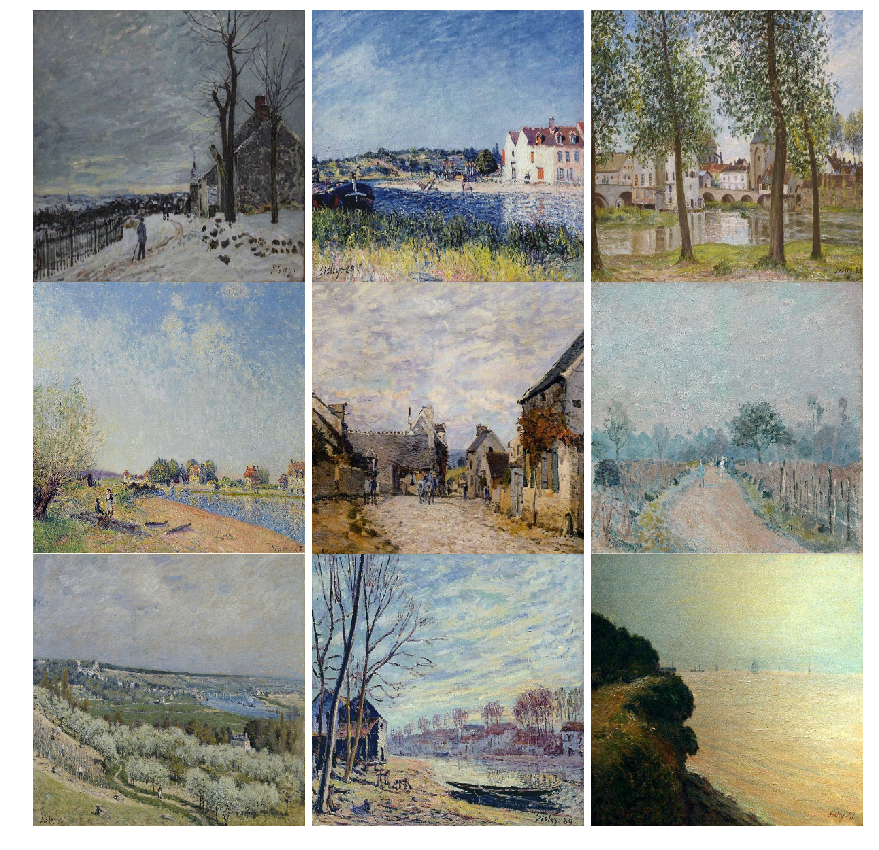

In [12]:
print(df[df['name'] == 'Alfred Sisley'])
plot_img('Alfred_Sisley')

           name        years          genre nationality  paintings
3  Claude Monet  1840 - 1926  Impressionism      French         73


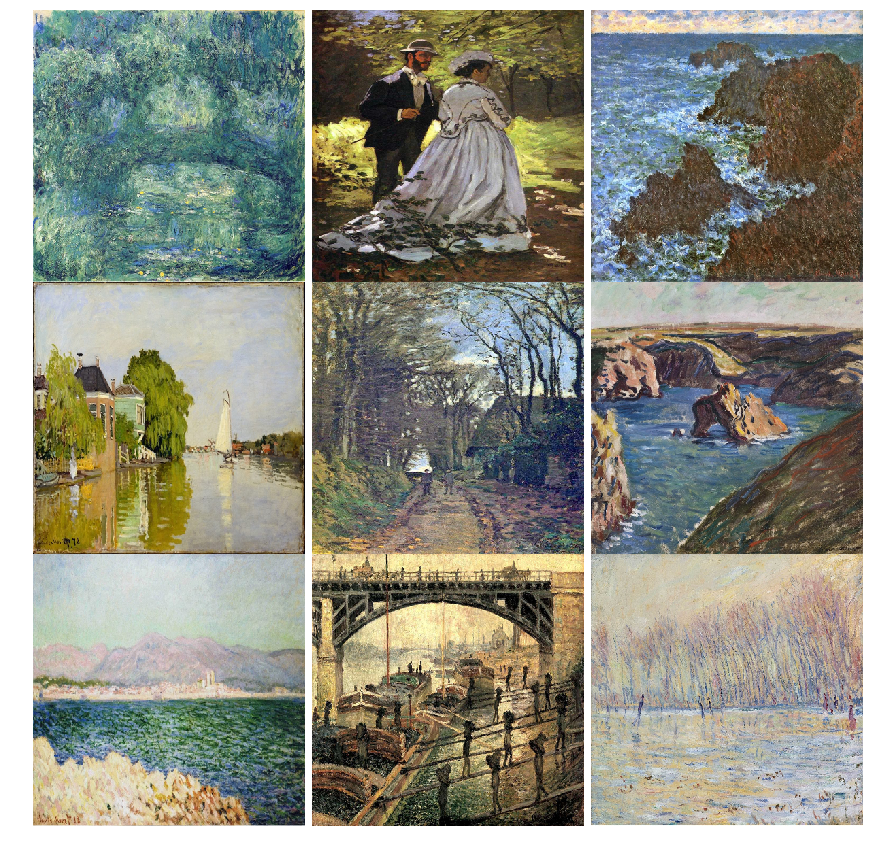

In [13]:
print(df[df['name'] == 'Claude Monet'])
plot_img('Claude_Monet')

Show baroque style paintings.

This style of painting is more similar, and basically people cannot distinguish painters by painting.

               name        years    genre nationality  paintings
27  Diego Velazquez  1599 - 1660  Baroque     Spanish        128


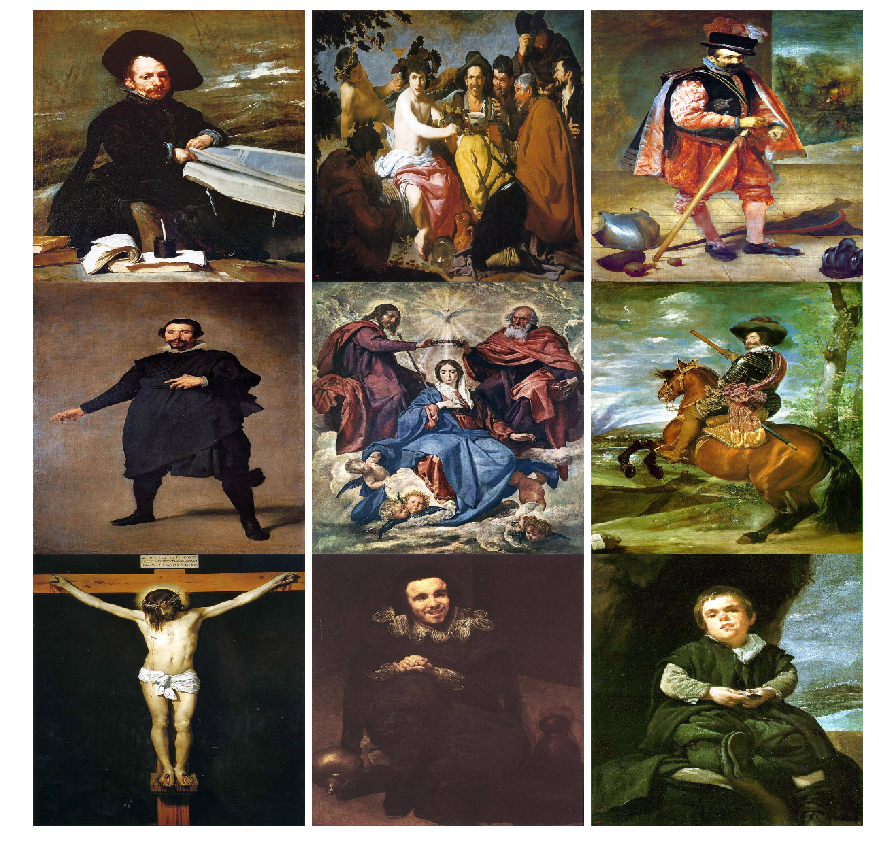

In [14]:
print(df[df['name'] == 'Diego Velazquez'])
plot_img('Diego_Velazquez')

          name        years    genre nationality  paintings
25  Caravaggio  1571 - 1610  Baroque     Italian         55


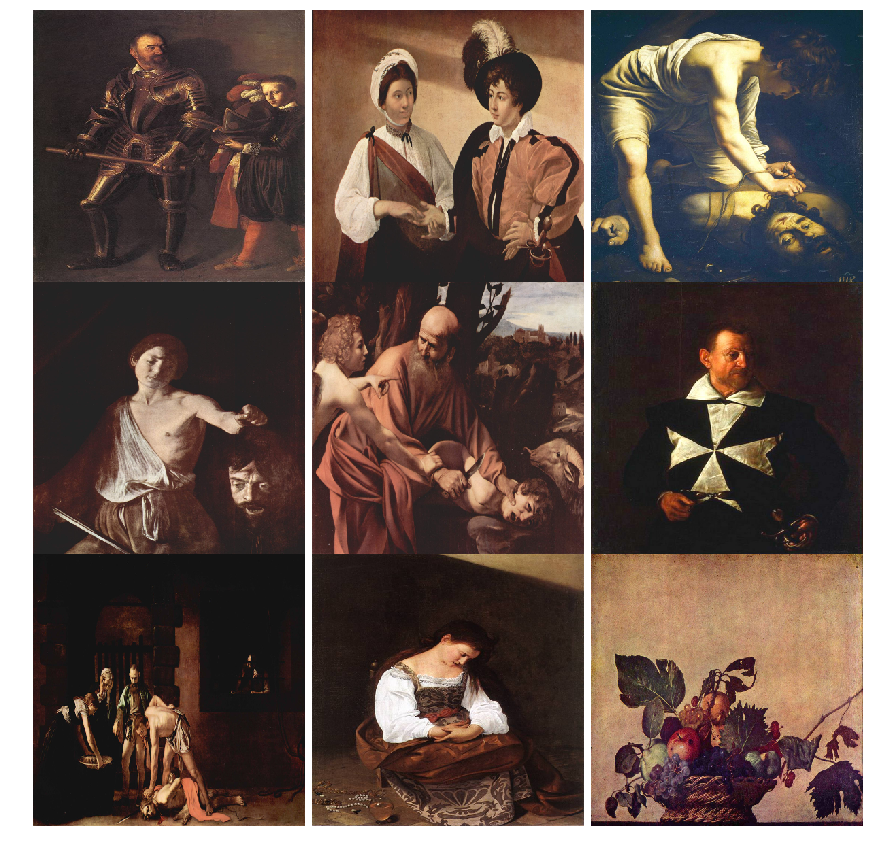

In [15]:
print(df[df['name'] == 'Caravaggio'])
plot_img('Caravaggio')

Soothe your mood and see one of my favorite paintings, now in the Museum of Modern Art in New York.

               name        years                   genre nationality  \
49  Jackson Pollock  1912 – 1956  Abstract Expressionism    American   

    paintings  
49         24  


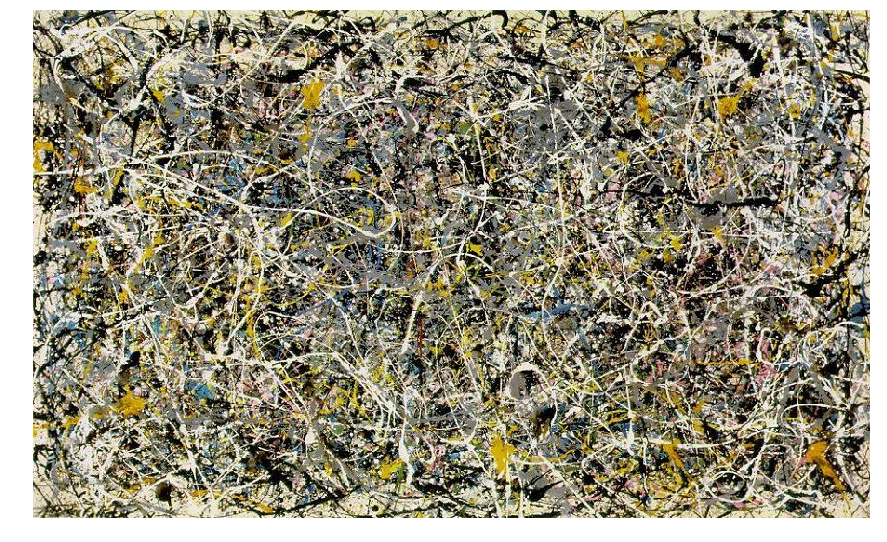

In [16]:
print(df[df['name'] == 'Jackson Pollock'])
plt.figure(figsize=(15,15))
img = cv2.imread('./images/Jackson_Pollock/Jackson_Pollock_13.jpg')
plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

Finally, use wordcloud to draw a summary of all writers' information.

<Figure size 432x288 with 0 Axes>

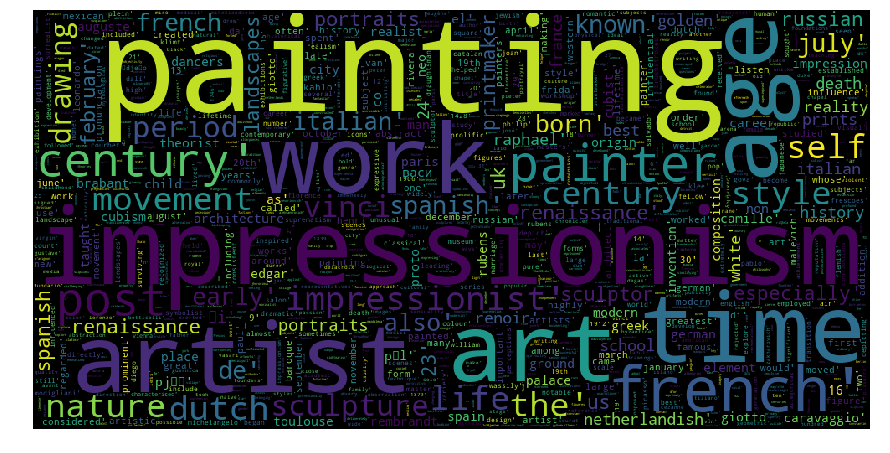

In [17]:
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from nltk.corpus import stopwords
df = pd.read_csv('./artists.csv')
column = 'bio'
nword = 1000
topic_words = [ z.lower() for y in 
               [ x.split() for x in df[column] if isinstance(x, str)]
               for z in y]
word_count_dict = dict(Counter(topic_words))
popular_words = sorted(word_count_dict, key = word_count_dict.get, reverse = True)
popular_words_nonstop = [w for w in popular_words if w not in stopwords.words("english")]
word_string=str(popular_words_nonstop)
wordcloud = WordCloud(stopwords = STOPWORDS, 
                      background_color = 'black', 
                      max_words = nword,
                      width = 1000,height = 500,).generate(word_string)
plt.clf()
plt.figure(figsize=(15,15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()